# TP2 - CompStats

In [4]:
import numpy as np 
import matplotlib.pyplot as plt
from scipy.special import logsumexp
from tqdm import tqdm
from sklearn.cluster import KMeans
import scipy
import seaborn as sns
sns.set()
import pandas as pd

seed_value = 42

## Exercise 1

In [5]:
np.random.seed(seed_value)

n = 10 
X = [k for k in range(10)]
random_numbers = np.random.rand(10)
probs = random_numbers / np.sum(random_numbers)
probs

array([0.07200801, 0.18278161, 0.14073106, 0.11509637, 0.0299957 ,
       0.02999106, 0.01116699, 0.16652855, 0.11556865, 0.13613201])

In [6]:
def inverse_cdf(u, X, probs):

    int_probs = np.cumsum(probs)
    if u <= int_probs[0]: return X[0]
    if u >= int_probs[-2]: return X[-1]
    for i in range(len(probs)-1):
        if u >= int_probs[i] and u < int_probs[i+1]:
            return X[i+1]

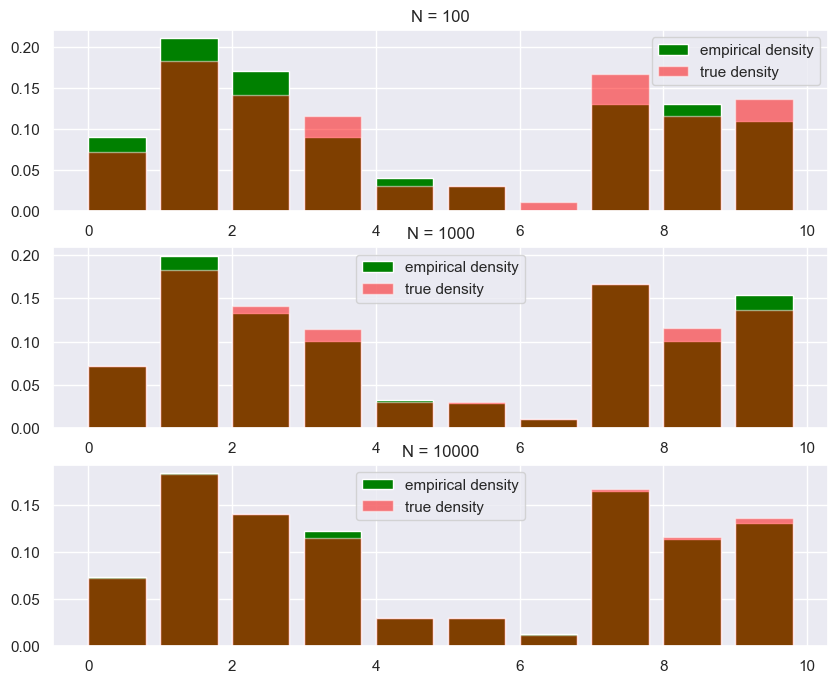

In [7]:
L_N = [100, 1000, 10000]

fig, axs = plt.subplots(3, figsize = (10,8))

for i, N in enumerate(L_N):

    U = np.random.rand(N)
    X_emp = [inverse_cdf(u, X, probs) for u in U]
    probs_emp = [(np.array(X_emp) == k).sum() / N for k in X]

    axs[i].bar(X, probs_emp, alpha=1, align='edge', color='green', label='empirical density')
    axs[i].bar(X, probs, alpha=0.5, align='edge', color='red', label='true density')
    axs[i].set_title(f'N = {N}')
    axs[i].legend()

## Exercise 2

### 2.

#### Parameters

In [8]:
np.random.seed(seed_value)

p = 4 #number of clusters 
d = 2 #2D gaussians 

Z = [k for k in range(1,p+1)] #label of clusters 

# simulation of the associated probabilities of the clusters 

probs = [1/(p+1)]*p
randomness = np.random.rand(p) 
randomness = (randomness / np.sum(randomness)) * (1 - np.sum(probs))
alphas_true = np.array(probs) + randomness

# simulation of the parameters of the gaussians 

spread = 10
means_true = (np.random.rand(p,2) - 1/2)* 10 
means_true[3,:] = np.array([0,-5])
means_true[0,:] += np.array([-1,0])

Covs_true = np.random.randn(p,2,2)
Covs_true = [(1e-4*np.eye(d) + np.dot(Covs_true[i], Covs_true[i].T))*0.3 for i in range(0,p)]

probabilities of the latent variables:  [0.22820431 0.27159244 0.25512196 0.24508129]
Eigen values of the covariance matrices:  [[0.1583196225443451, 0.12567170585082751], [1.2593248983669578, 0.8439438506092145], [0.3000572439414536, 0.8831090753263393], [0.7636530099677837, 0.5064776013070851]]


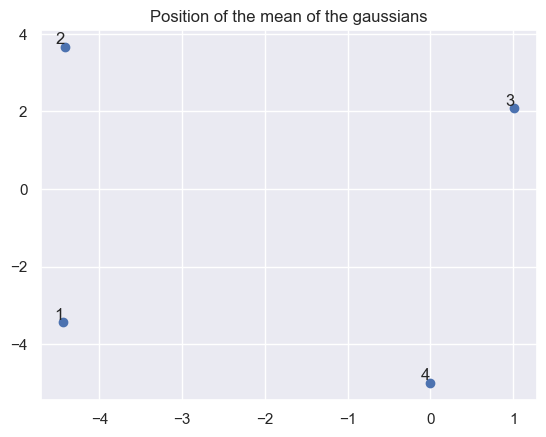

In [9]:
print("probabilities of the latent variables: ", alphas_true)

print("Eigen values of the covariance matrices: ", [list(np.linalg.eigvals(Covs_true[i])) for i in range(0,p)])

plt.scatter(means_true[:,0], means_true[:,1])
for i, latent in enumerate(Z):
    plt.text(means_true[i,0], means_true[i,1], latent, fontsize=12, ha='right', va='bottom')
    plt.title('Position of the mean of the gaussians')


#### Simulation

Text(0.5, 1.0, "Simulation of a Gaussian Mixture Model: {1: 'red', 2: 'blue', 3: 'brown', 4: 'green'}")

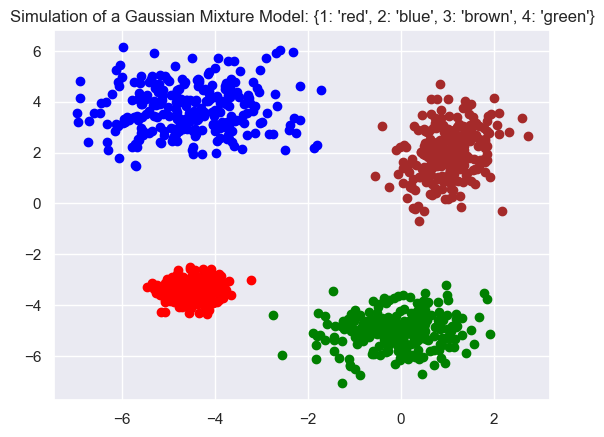

In [10]:
np.random.seed(seed_value)

N = 1000
U = np.random.rand(N)
labels = [inverse_cdf(u, Z, alphas_true) for u in U]
N_labels = [(np.array(labels) == z).sum() for z in Z]

samples = {}
for z in Z:
    samples[z] = np.random.multivariate_normal(means_true[z-1], Covs_true[z-1], size = N_labels[z-1])
data = np.concatenate(list(samples.values()))
colors = {
    1:'red',
    2:'blue',
    3:'brown',
    4:'green'
}
for z in Z:
    plt.scatter(samples[z][:,0], samples[z][:,1], color = colors[z])
plt.title(f'Simulation of a Gaussian Mixture Model: {colors}')

### 3. Implementation of the EM algorithm 

In [11]:
def taus(data,alphas,means,Covs):

    #compute tau for every i and j at a given step 
    N, p = data.shape[0], len(alphas)
    tau_ = np.zeros((N,p))
    tau_ = tau_ + np.log(alphas) -np.log(2*np.pi) -0.5* np.linalg.slogdet(np.array(Covs))[1] 
    for k in range(p):
        tau_[:,k] += -0.5 * np.sum(np.dot((data-means[k]),np.linalg.pinv(Covs[k])) * (data-means[k]), axis = 1)
    
    tau = np.zeros((N,p))
    tau = tau_ - np.expand_dims(logsumexp(tau_, axis=1), axis=1)

    return np.exp(tau)

In [12]:
def EM(data, alphas0, means0, Covs0, n_iter_max=50):

    alphas, means, Covs = alphas0, means0, Covs0
    N, p = data.shape[0], len(alphas0)
    loglikelihood = [Loglikelihood(data, alphas, means, Covs)]
    for _ in tqdm(range(n_iter_max)):

        tau = taus(data,alphas,means,Covs)
        alphas = np.sum(tau, axis = 0) / N

        for k in range(p):
            means[k] = np.sum(np.expand_dims(tau[:,k], axis=1)*data, axis=0) / np.sum(tau[:,k], axis=0)
        for k in range(p):
            Covs[k] = np.sum(np.expand_dims(np.expand_dims(tau[:,k], axis=1), axis=2) * np.einsum('ij,ik->ijk', data - means[k], data - means[k]), axis = 0) / np.sum(tau[:,k], axis=0)
        loglikelihood.append(Loglikelihood(data, alphas, means, Covs))

    return alphas, means, Covs, loglikelihood

def init(data, p):

    np.random.seed(seed_value)
    alphas_init = np.ones(p) / p
    means_init = data[np.random.randint(0,n,p)]

    data_mean = np.mean(data, axis=0)
    cov_ = np.mean((data-data_mean).T @ (data-data_mean))
    cov = np.eye(2)
    l = []
    for _ in range(p):
        l.append(cov * cov_ / p)
    Covs_init = np.array(l)

    return alphas_init, means_init, Covs_init

In [13]:
def Loglikelihood(data, alphas, means, Covs):
    
    values = np.zeros((data.shape[0], alphas.shape[0]))

    for k in range(alphas.shape[0]):
        normals = scipy.stats.multivariate_normal.pdf(data, means[k], Covs[k] , allow_singular =True)
        values[:,k] = alphas[k] * normals
        
    res = np.log(np.sum(values, axis = 1))
    
    return np.sum(res)

In [14]:
### initialization

kmeans = KMeans(n_clusters=p)
kmeans.fit(data)
means_init = kmeans.cluster_centers_
Covs_init = [np.cov(data[kmeans.labels_ == i].T) for i in range(p)]
alphas_init = np.bincount(kmeans.labels_) / len(data)

c:\Users\benja\anaconda3\envs\timeseries\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [15]:
alphas0, means0, Covs0 = init(data, p)
alphas_res, means_res, Covs_res, likelihood = EM(data, alphas0, means0, Covs0, n_iter_max=100)

100%|██████████| 100/100 [00:00<00:00, 484.15it/s]


Text(0.5, 0, 'iterations')

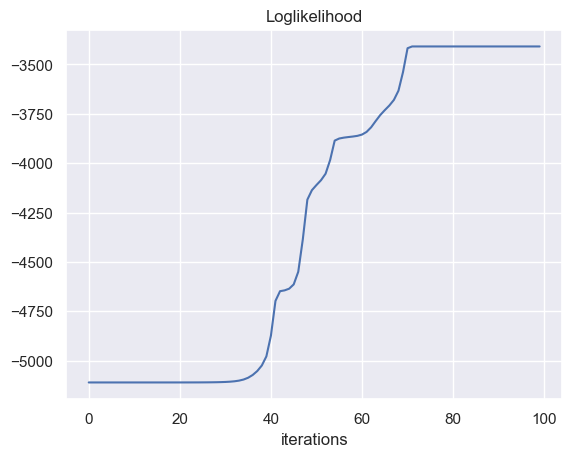

In [16]:
plt.plot(likelihood[1:]), likelihood[-1]
plt.title('Loglikelihood')
plt.xlabel('iterations')

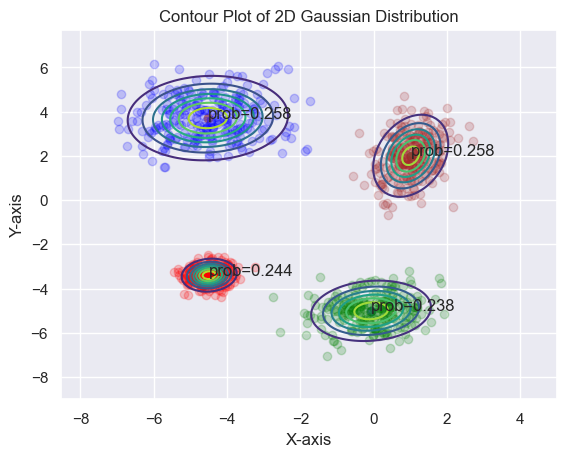

In [17]:
# Set mean and covariance matrix for the 2D Gaussian distribution
for k in range(p):

    mean = means_res[k]
    covariance_matrix = Covs_res[k]

    # Create a grid of x, y values
    x, y = np.meshgrid(np.linspace(-4 + mean[0], 4 + mean[0], 100), np.linspace(-4 + mean[1], 4 + mean[1], 100))
    pos = np.dstack((x, y))

    # Create a multivariate normal distribution
    gaussian = scipy.stats.multivariate_normal(mean, covariance_matrix)

    # Calculate the probability density function (PDF) values for each point in the grid
    pdf_values = gaussian.pdf(pos)

    # Plot the contour of the Gaussian distribution
    plt.contour(x, y, pdf_values, cmap='viridis')
    plt.scatter(mean[0], mean[1])
    plt.text(mean[0], mean[1], f'prob={int(alphas_res[k]*1000)/1000}')
for z in Z:
    plt.scatter(samples[z][:,0], samples[z][:,1], color = colors[z], alpha = 0.2)
    #plt.title(f'Simulation of a Gaussian Mixture Model: {colors}')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('Contour Plot of 2D Gaussian Distribution')
plt.show()

In [18]:
print('Note the the index of the predicted parameters are not necessarely the same as those in the groundtruth \n')
print('True probability', alphas_true)
print('Predicted probability', alphas_true)
print('\n')
print('True means', means_true)
print('Predicted means', means_res)
print('\n')
print('True variances', Covs_true)
print('Predicted variances', Covs_res)
print('\n')


Note the the index of the predicted parameters are not necessarely the same as those in the groundtruth 

True probability [0.22820431 0.27159244 0.25512196 0.24508129]
Predicted probability [0.22820431 0.27159244 0.25512196 0.24508129]


True means [[-4.4398136  -3.4400548 ]
 [-4.41916388  3.66176146]
 [ 1.01115012  2.08072578]
 [ 0.         -5.        ]]
Predicted means [[-0.06850884 -5.00811378]
 [-4.52373981  3.7062975 ]
 [ 1.01260138  2.00248894]
 [-4.48665472 -3.39564403]]


True variances [array([[ 0.15446328, -0.01053709],
       [-0.01053709,  0.12952805]]), array([[1.11578611, 0.19753458],
       [0.19753458, 0.98748264]]), array([[0.33740348, 0.14275871],
       [0.14275871, 0.84576284]]), array([[0.65976038, 0.1261941 ],
       [0.1261941 , 0.61037024]])]
Predicted variances [[[0.68557126 0.07063853]
  [0.07063853 0.47906954]]

 [[1.15665219 0.05537362]
  [0.05537362 0.88222251]]

 [[0.27683805 0.14589414]
  [0.14589414 0.91207673]]

 [[0.13525837 0.01285999]
  [0.01285999 

In conclusion, our algorithm worked well for our dataset. The found parameters are closed to the true ones.

### 5.

In [19]:
df = pd.read_csv(r"C:\Users\benja\Documents\MVA\P1\CompStats\TP2\WPP2022_Demographic_Indicators_Medium.csv")
data = df[['CBR', 'CDR']].dropna().to_numpy()

C:\Users\benja\AppData\Local\Temp\ipykernel_30600\3369503751.py:1: DtypeWarning:

Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.



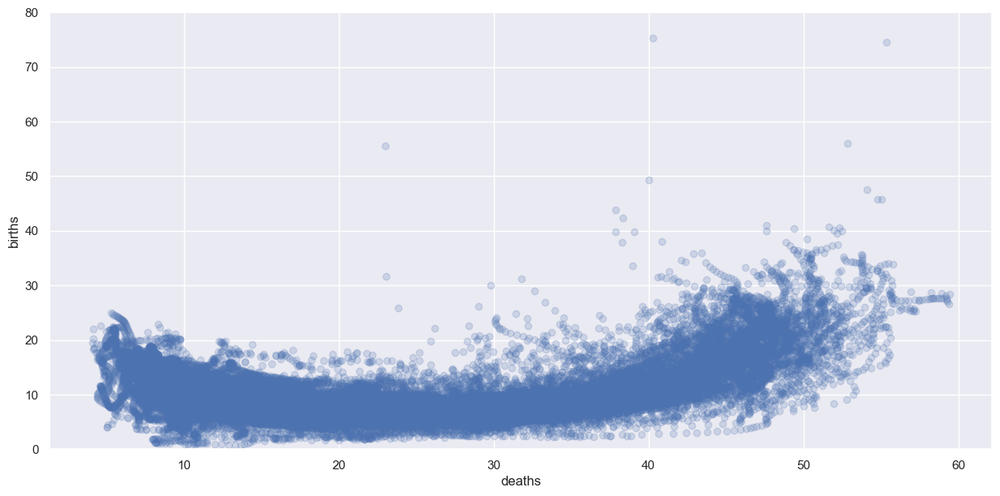

In [20]:
plt.figure(figsize = (15,7))
plt.xlabel('deaths')
plt.ylabel('births')
plt.ylim([0,80])
plt.scatter(data[:,0], data[:,1], alpha=0.2)


We can use a Gaussian mixture model to analyze this dataset. Given that the data has been collected globally, it's reasonable to hypothesize that the underlying patterns in its evolution are consistent across different regions. Therefore, employing multiple Gaussian distributions for modeling could yield valuable insights into the nuanced variations present worldwide.

### 6.

  0%|          | 0/50 [00:00<?, ?it/s]100%|██████████| 50/50 [00:01<00:00, 32.25it/s]


Text(0.5, 1.0, 'Contour Plot of 2D Gaussian Distribution')

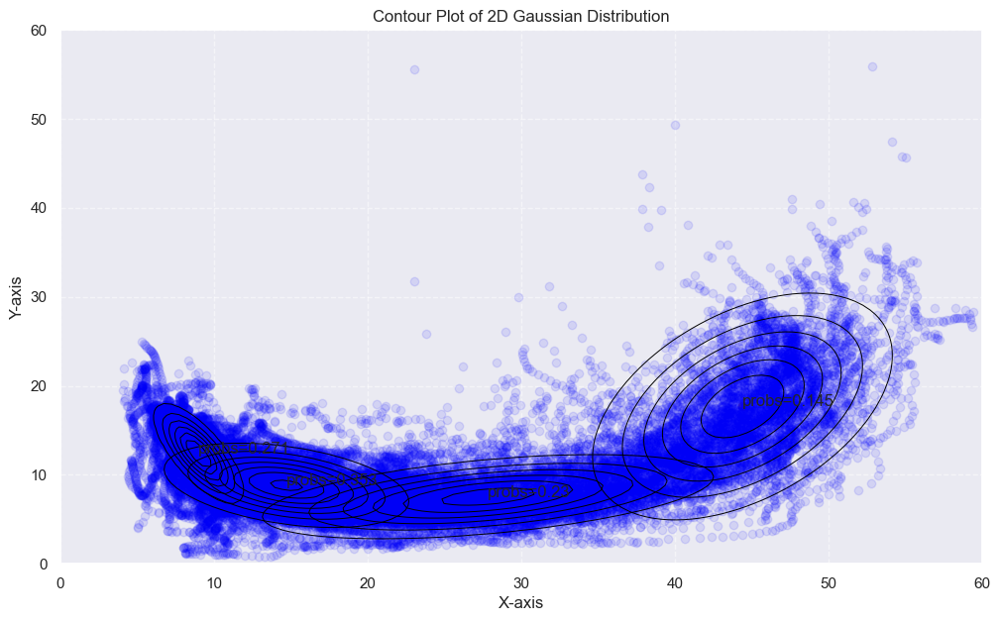

In [21]:
p = 4
alphas0, means0, Covs0 = init(data, p)
alphas_res, means_res, Covs_res, likelihood = EM(data, alphas0, means0, Covs0, n_iter_max=50)  
plt.figure(figsize=(12,7))
plt.grid(True, linestyle='--', alpha=0.5)
for k in range(p):

    mean = means_res[k]
    covariance_matrix = Covs_res[k]

    # Create a grid of x, y values
    x, y = np.meshgrid(np.linspace(-25 + mean[0], 25 + mean[0], 100), np.linspace(-25 + mean[1], 25 + mean[1], 100))
    pos = np.dstack((x, y))
    
    # Create a multivariate normal distribution
    gaussian = scipy.stats.multivariate_normal(mean, covariance_matrix)

    # Calculate the probability density function (PDF) values for each point in the grid
    pdf_values = gaussian.pdf(pos)

    # Plot the contour of the Gaussian distribution
    plt.contour(x, y, pdf_values, colors='black', linewidths=0.7)
    plt.scatter(mean[0], mean[1])
    plt.text(mean[0], mean[1], f'probs={int(alphas_res[k]*1000)/1000}')
plt.scatter(data[:,0], data[:,1], color = 'blue', alpha=0.1)
    #plt.title(f'Simulation of a Gaussian Mixture Model: {colors}')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.xlim([0,60])
plt.ylim([0,60])
plt.title('Contour Plot of 2D Gaussian Distribution')
#axs[p-1].show()

Text(0.5, 1.0, 'Loglikelihood')

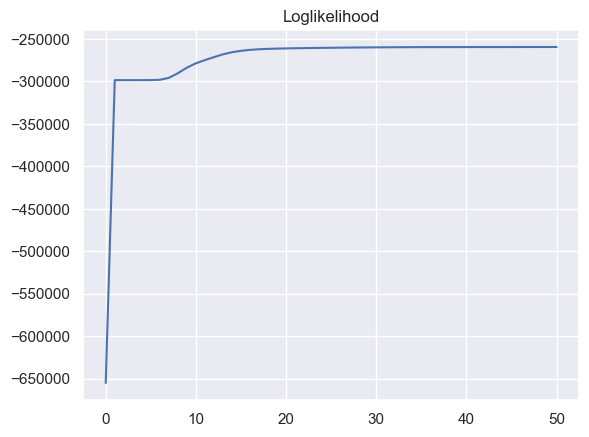

In [22]:
plt.plot(likelihood)
plt.title('Loglikelihood')

100%|██████████| 50/50 [00:02<00:00, 17.09it/s]


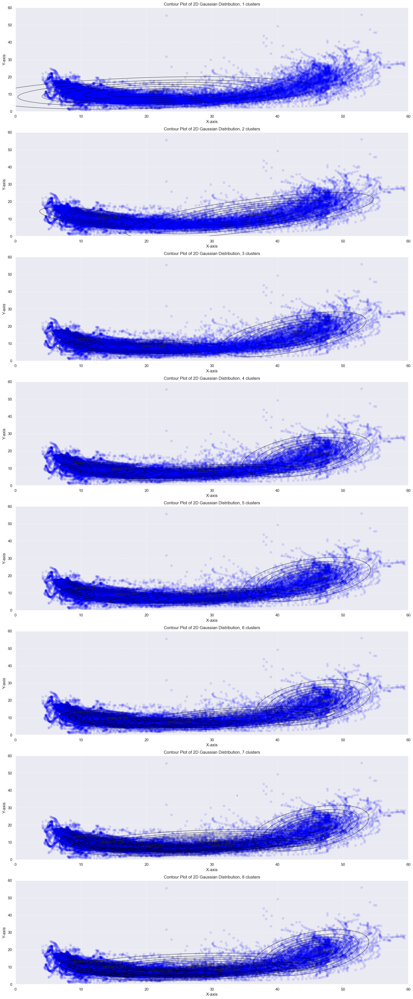

In [23]:
p_max = 8
fig, axs = plt.subplots(p_max, figsize = (20,50))

for p in range(1,p_max+1):
    alphas0, means0, Covs0 = init(data, p)
    alphas_res, means_res, Covs_res, likelihood = EM(data, alphas0, means0, Covs0, n_iter_max=50)  

    for k in range(p):

        mean = means_res[k]
        covariance_matrix = Covs_res[k]

        # Create a grid of x, y values
        x, y = np.meshgrid(np.linspace(-25 + mean[0], 25 + mean[0], 100), np.linspace(-25 + mean[1], 25 + mean[1], 100))
        pos = np.dstack((x, y))

        # Create a multivariate normal distribution
        gaussian = scipy.stats.multivariate_normal(mean, covariance_matrix)

        # Calculate the probability density function (PDF) values for each point in the grid
        pdf_values = gaussian.pdf(pos)

        # Plot the contour of the Gaussian distribution
        axs[p-1].contour(x, y, pdf_values, colors='black', linewidths=0.7)
        axs[p-1].scatter(mean[0], mean[1])
        axs[p-1].text(mean[0], mean[1], f'probs={int(alphas_res[k]*1000)/1000}')
        axs[p-1].grid(True, linestyle='--', alpha=0.5)

    axs[p-1].scatter(data[:,0], data[:,1], color = 'blue', alpha=0.1)
        #plt.title(f'Simulation of a Gaussian Mixture Model: {colors}')
    axs[p-1].set_xlabel('X-axis')
    axs[p-1].set_ylabel('Y-axis')
    axs[p-1].set_xlim([0,60])
    axs[p-1].set_ylim([0,60])
    axs[p-1].set_title(f'Contour Plot of 2D Gaussian Distribution, {p} clusters')

In [24]:
def BIC(data, p_max):

    N = data.shape[0]
    BIC = []
    for p in tqdm(range(1, p_max+1)):
        alphas0, means0, Covs0 = init(data, p)
        loglikelihood = EM(data, alphas0, means0, Covs0, n_iter_max=50)[-1]
        BIC.append(-loglikelihood[-1] + (df(p) * np.log(N)) / 2)
    return BIC

def df(p):
    return p * (2 + 2*2 + 1) - 1

In [25]:
BICs = BIC(data, p_max = 12)

100%|██████████| 12/12 [00:27<00:00,  2.33s/it]


The optimal number of clusters is:  9


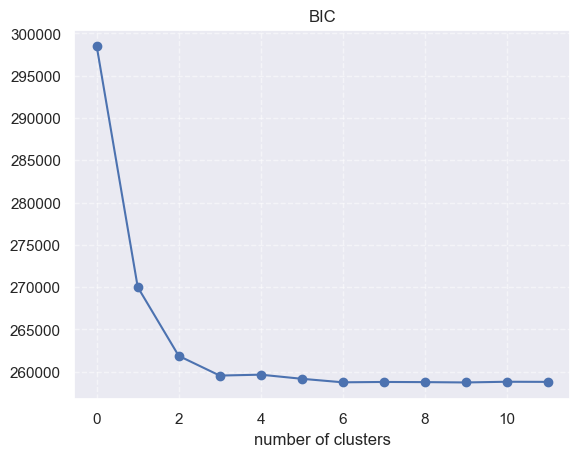

In [26]:
plt.plot(BICs, marker = 'o')
plt.grid(True, linestyle='--', alpha=0.5)
plt.title('BIC')
plt.xlabel('number of clusters')

print('The optimal number of clusters is: ', np.argmin(BICs))


Any value after 6 seems to be a good choice, according to the BIC criterion. 

## Exercise 3

### 1.

In [27]:
def f(x):

    return 2 * np.sin((2 * np.pi * x) / 3) * (x >= 0)

def p(x):

    return x**(0.65) * np.exp(-x**2 / 2) * (x >= 0)

def q(x, mu=0.8):

    gaussian_distr = scipy.stats.norm(loc=mu, scale=np.sqrt(1.5))
    return 2 * gaussian_distr.pdf(x)

In [28]:
def IS(N, f, p, q, var = 1.5, mu = 0.8):
    '''
    In this function, we choosed to sample 3*N and only keep the first N positives samples. Althought this sampling strategy is not optimum,
    I choosed to do so because we do not deal with complicate functions in this exercise and it allows to be sure to actually have N samples.
    '''
    X = mu + np.sqrt(var) * np.random.randn(3*N)
    X = X[X >= 0]
    X = X[:N] #keep only the positive samples
    assert X.shape[0] == N

    w = p(X) / q(X, mu=mu)
    w = w / (np.sum(w) / N)

    return np.sum(f(X) * w) / N, w

### 2.

In [29]:
L_N = [10 ** k for k in range(1,5)]
M = 1000
dic = {}
for N in tqdm(L_N):
    dic[N] = []
    for _ in range(M):
        dic[N].append(IS(N, f, p, q)[0])

100%|██████████| 4/4 [00:04<00:00,  1.12s/it]


In [30]:
for N in L_N:
    print(f"Mean of the estimator for N={N} is: ", np.mean(dic[N]))
    print(f"Variance of the estimator for N={N} is: ", np.var(dic[N]), '\n')

Mean of the estimator for N=10 is:  0.7414987759159918
Variance of the estimator for N=10 is:  0.15335458428057275 

Mean of the estimator for N=100 is:  0.7718657370822185
Variance of the estimator for N=100 is:  0.01510718336018815 

Mean of the estimator for N=1000 is:  0.7678625585128076
Variance of the estimator for N=1000 is:  0.001555061387466571 

Mean of the estimator for N=10000 is:  0.7694804784057402
Variance of the estimator for N=10000 is:  0.00015007393191817126 



### 3. 

In [31]:
L_N = [10 ** k for k in range(1,5)]
M = 1000
dic = {}
for N in tqdm(L_N):
    dic[N] = []
    for _ in range(M):
        dic[N].append(IS(N, f, p, q, mu = 6)[0])

100%|██████████| 4/4 [00:04<00:00,  1.10s/it]


In [32]:
for N in L_N:
    print(f"Mean of the estimator for N={N} is: ", np.mean(dic[N]))
    print(f"Variance of the estimator for N={N} is: ", np.var(dic[N]), '\n')

Mean of the estimator for N=10 is:  0.28071088709164355
Variance of the estimator for N=10 is:  1.7757162481664186 

Mean of the estimator for N=100 is:  0.04068683996555278
Variance of the estimator for N=100 is:  1.6379491151560317 

Mean of the estimator for N=1000 is:  -1.009506655904561
Variance of the estimator for N=1000 is:  0.6392693545246176 

Mean of the estimator for N=10000 is:  -0.0852575209023808
Variance of the estimator for N=10000 is:  0.9508457416256055 



We see that our estimator is not good anymore when considering $\mu = 6$.

In [33]:
L_N = [10 ** k for k in range(1,5)]
M = 1000
dic = {}
L_dic = []
for mu in [0.8, 6]:
    for N in tqdm(L_N):
        dic[N] = []
        for _ in range(M):
            dic[N].append(IS(N, f, p, q, mu = mu)[1])
    L_dic.append(dic)
    dic = {}

100%|██████████| 4/4 [00:04<00:00,  1.14s/it]


In [34]:
for N in L_N[1:]:
    print(f"Median of the weigths for N={N} and mu=0.8 is: ", np.median(L_dic[0][N]))
    print(f"Mean of the weigths for N={N} and mu=0.8 is: ", np.mean(L_dic[0][N]))
print('\n')
for N in L_N[1:]:
    print(f"Median of the weigths for N={N} and mu=6 is: ", np.median(L_dic[1][N]))
    print(f"Mean of the weigths for N={N} and mu=6 is: ", np.mean(L_dic[1][N]))

Median of the weigths for N=100 and mu=0.8 is:  1.114050998346125
Mean of the weigths for N=100 and mu=0.8 is:  1.0000000000000002
Median of the weigths for N=1000 and mu=0.8 is:  1.1148396778121
Mean of the weigths for N=1000 and mu=0.8 is:  0.9999999999999997
Median of the weigths for N=10000 and mu=0.8 is:  1.1156240407440952
Mean of the weigths for N=10000 and mu=0.8 is:  1.0000000000000002


Median of the weigths for N=100 and mu=6 is:  5.094319173176696e-06
Mean of the weigths for N=100 and mu=6 is:  1.0
Median of the weigths for N=1000 and mu=6 is:  6.775318599032288e-07
Mean of the weigths for N=1000 and mu=6 is:  0.9999999999999999
Median of the weigths for N=10000 and mu=6 is:  2.435570896191205e-07
Mean of the weigths for N=10000 and mu=6 is:  0.9999999999999986


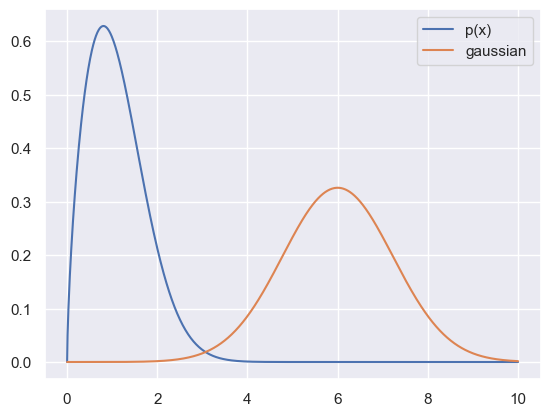

In [35]:
x = np.linspace(0,10,1000)
ff = scipy.stats.norm(loc=6, scale=np.sqrt(1.5))
plt.plot(x,p(x),label = 'p(x)')
plt.plot(x, ff.pdf(x), label='gaussian')
plt.legend()

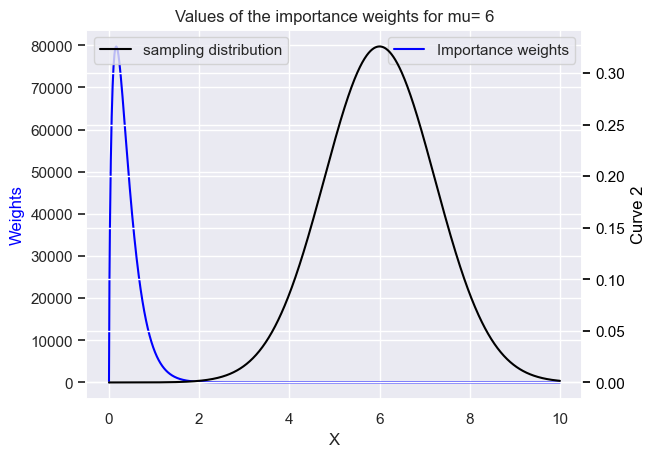

In [36]:
x = np.linspace(0,10,1000)
ff = scipy.stats.norm(loc=6, scale=np.sqrt(1.5))
w = p(x) / ff.pdf(x)

fig, ax1 = plt.subplots()

ax1.plot(x, w, color='blue', label='Importance weights')
ax1.set_xlabel('X')
ax1.set_ylabel('Weights', color='blue')
#ax1.tick_params('y', colors='blue')
ax1.legend()

ax2 = ax1.twinx()

# Plot the second curve on the secondary y-axis
ax2.plot(x, ff.pdf(x), color='black', label='sampling distribution')
ax2.set_ylabel('Curve 2', color='black')
ax2.tick_params('y', colors='black')
ax1.set_title('Values of the importance weights for mu= 6')
ax2.legend()


In conclusion, we see that althought the means of the importance weights are equal to 1 (by construction), the medians of the weights are really different. For $\mu = 0.8$, the overall values of the importance weights are close to 1, where for $\mu = 6$, the importance weights are really small. It can be explained because when $\mu = 6$, we mainly sample around 8, so we do not go close to the area where p is above 0. Hence, the ratio $\frac{p}{q}$ tends to be small. 

### 5.

In [37]:
d = 5 
sigma1 = 1
b = 0.4
p = 4 #number of clusters 
Z = [k for k in range(1,p+1)] #label of clusters 

## initialization 
np.random.seed(seed_value)

alphas_init = np.array([1/p]*p)
means_init = np.random.randn(p,d) * 3
Covs_init = np.random.randn(p,d,d)
Covs_init = np.array([np.eye(d) + Covs_init[i].T @ Covs_init[i] for i in range(p)])

In [38]:
def nu(x):
    mean, Cov = np.zeros(d), np.eye(d)
    Cov[0,0] = sigma1**2 #useless if sigma1 = 1
    new_x = x.copy()
    new_x[:,1] += b*(new_x[:,0]**2 - sigma1**2)
    gaussian = scipy.stats.multivariate_normal(mean, Cov)
    return gaussian.pdf(new_x)


def taus(data,alphas,means,Covs):

    #compute tau for every i and j at a given step 
    N, p = data.shape[0], len(alphas)
    tau_ = np.zeros((N,p))
    tau_ = tau_ + np.log(alphas) -np.log(2*np.pi) -0.5* np.linalg.slogdet(np.array(Covs))[1] 
    for k in range(p):
        tau_[:,k] += -0.5 * np.sum(np.dot((data-means[k]),np.linalg.pinv(Covs[k])) * (data-means[k]), axis = 1)
    
    tau = np.zeros((N,p))
    tau = tau_ - np.expand_dims(logsumexp(tau_, axis=1), axis=1)

    return np.exp(tau)

def Pop_MC(N, alphas_init, means_init, Covs_init, n_iter_max=30):

    alphas, means, Covs = alphas_init, means_init, Covs_init
    #loglikelihood = [Loglikelihood(data, alphas, means, Covs)]

    for n_iter in tqdm(range(n_iter_max)):

        #sample N from the gaussian mixture models
        data = mixture_multivariate_normal(N,alphas,Z,means,Covs)
        w = nu(data) / mixture_multivariate_normal_pdf(data,alphas,Z,means,Covs)
        #print(mixture_multivariate_normal_pdf(data,alphas,Z,means,Covs).min())
        w = w / np.mean(w)
        #print('w',w.min(), n_iter)
        tau = taus(data,alphas,means,Covs)
        tau *= w[:,np.newaxis]
        if n_iter >= 5:
            breakpoint()

        alphas = np.sum(tau, axis = 0) / np.sum(tau)

        for k in range(p):
            means[k] = np.sum(np.expand_dims(tau[:,k], axis=1)*data, axis=0) / np.sum(tau[:,k], axis=0)
        for k in range(p):
            Covs[k] = np.sum(np.expand_dims(np.expand_dims(tau[:,k], axis=1), axis=2) * np.einsum('ij,ik->ijk', data - means[k], data - means[k]), axis = 0) / np.sum(tau[:,k], axis=0)
            Covs[k] += 1e-6 * np.eye(d)
        #loglikelihood.append(Loglikelihood(data, alphas, means, Covs))
        
    return alphas, means, Covs

def mixture_multivariate_normal(N,alphas,Z,means,Covs):

    U = np.random.rand(N)
    labels = [inverse_cdf(u, Z, alphas) for u in U]
    N_labels = [(np.array(labels) == z).sum() for z in Z]

    samples = {}
    for z in Z:
        try:
            np.random.multivariate_normal(means[z-1], Covs[z-1], size = N_labels[z-1])
        except:
            print(Covs)
        samples[z] = np.random.multivariate_normal(means[z-1], Covs[z-1], size = N_labels[z-1])
    data = np.concatenate(list(samples.values()))

    return data

def mixture_multivariate_normal_pdf(data,alphas,Z,means,Covs):

    p = alphas.shape[0]
    pdf = np.zeros(data.shape[0])
    for k in range(p):
        gaussian = scipy.stats.multivariate_normal(means[k], Covs[k])
        pdf += alphas[k] * gaussian.pdf(data)
    return pdf 

In [39]:
N = 10000
alphas, means, Covs = Pop_MC(N, alphas_init.copy(), means_init.copy(), Covs_init.copy(), n_iter_max=100)

  0%|          | 0/100 [00:00<?, ?it/s]100%|██████████| 100/100 [00:05<00:00, 18.66it/s]


In [40]:
res = mixture_multivariate_normal(10000,alphas,Z,means,Covs)

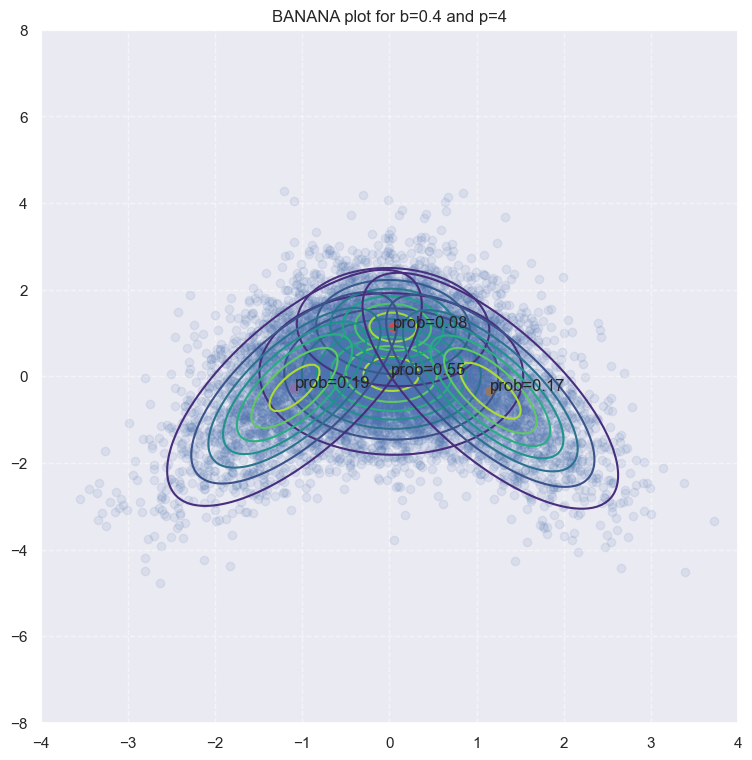

In [41]:
plt.figure(figsize=(9,9))
plt.scatter(res[:,0], res[:,1], alpha=0.1)
plt.scatter(means[:,0], means[:,1])
plt.grid(True, linestyle='--', alpha=0.5)
for k in range(p):

    mean = means[k][:2]
    covariance_matrix = Covs[k][:2,:2]

    # Create a grid of x, y values
    x, y = np.meshgrid(np.linspace(-25 + mean[0], 25 + mean[0], 1000), np.linspace(-25 + mean[1], 25 + mean[1], 1000))
    pos = np.dstack((x, y))

    # Create a multivariate normal distribution
    gaussian = scipy.stats.multivariate_normal(mean, covariance_matrix)

    # Calculate the probability density function (PDF) values for each point in the grid
    pdf_values = gaussian.pdf(pos)

    # Plot the contour of the Gaussian distribution
    plt.contour(x, y, pdf_values, cmap='viridis')
    plt.scatter(mean[0], mean[1])
    plt.text(mean[0], mean[1], f'prob={int(alphas[k]*100)/100}')
    plt.xlim([-4,4])
    plt.ylim([-8,8])
    plt.title(f'BANANA plot for b={b} and p={p}')


In [79]:
d = 5 
sigma1 = 1
b = 1
p = 3 #number of clusters 
Z = [k for k in range(1,p+1)] #label of clusters 

## initialization 
np.random.seed(seed_value)

alphas_init = np.array([1/p]*p)
means_init = np.random.randn(p,d) * 3
Covs_init = np.random.randn(p,d,d)
Covs_init = np.array([np.eye(d) + Covs_init[i].T @ Covs_init[i] for i in range(p)])

In [80]:
N = 10000
alphas, means, Covs = Pop_MC(N, alphas_init.copy(), means_init.copy(), Covs_init.copy(), n_iter_max=100)
res = mixture_multivariate_normal(10000,alphas,Z,means,Covs)

  0%|          | 0/100 [00:00<?, ?it/s]100%|██████████| 100/100 [00:05<00:00, 19.35it/s]


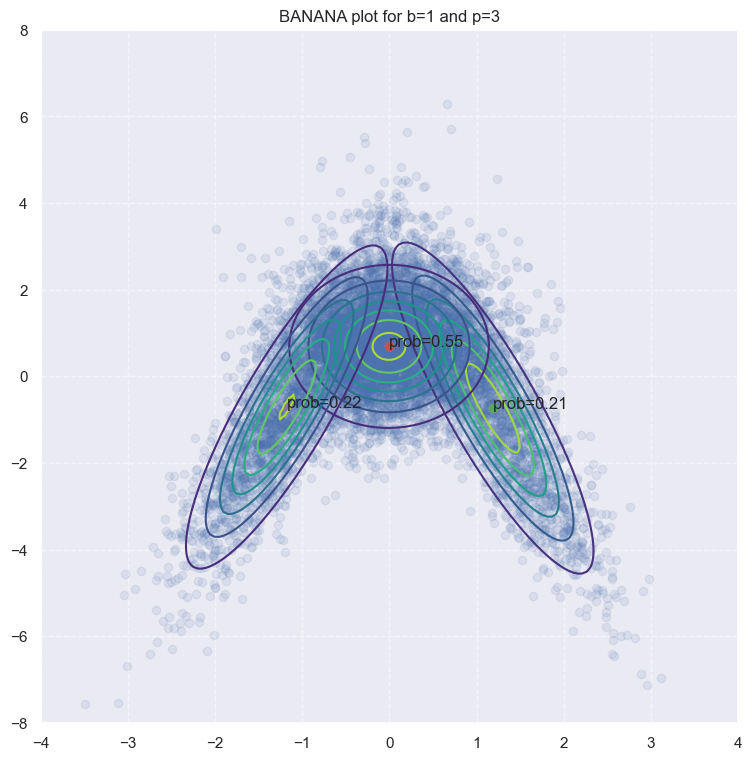

In [81]:
plt.figure(figsize=(9,9))
plt.scatter(res[:,0], res[:,1], alpha=0.1)
plt.scatter(means[:,0], means[:,1])
plt.grid(True, linestyle='--', alpha=0.5)
for k in range(p):

    mean = means[k][:2]
    covariance_matrix = Covs[k][:2,:2]

    # Create a grid of x, y values
    x, y = np.meshgrid(np.linspace(-25 + mean[0], 25 + mean[0], 1000), np.linspace(-25 + mean[1], 25 + mean[1], 1000))
    pos = np.dstack((x, y))

    # Create a multivariate normal distribution
    gaussian = scipy.stats.multivariate_normal(mean, covariance_matrix)

    # Calculate the probability density function (PDF) values for each point in the grid
    pdf_values = gaussian.pdf(pos)

    # Plot the contour of the Gaussian distribution
    plt.contour(x, y, pdf_values, cmap='viridis')
    plt.scatter(mean[0], mean[1])
    plt.text(mean[0], mean[1], f'prob={int(alphas[k]*100)/100}')
    plt.xlim([-4,4])
    plt.ylim([-8,8])
    plt.title(f'BANANA plot for b={b} and p={p}')


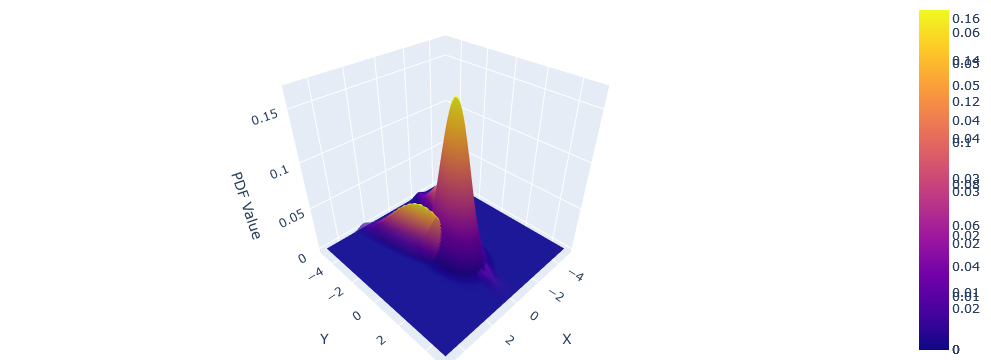

In [82]:
import numpy as np
import plotly.graph_objects as go
from scipy.stats import multivariate_normal

# Generate sample data for two 2D Gaussians
'''
mean1 = np.array([2, 3])
covariance1 = np.array([[1, 0.5], [0.5, 1]])
mean2 = np.array([-2, -1])
covariance2 = np.array([[2, -1], [-1, 2]])
'''
colorscales = ['plasma']*3
for k in range(p):

    x = np.linspace(-5, 5, 100)
    y = np.linspace(-5, 5, 100)
    X, Y = np.meshgrid(x, y)

    pos = np.dstack((X, Y))

    pdf = alphas[k] * multivariate_normal(means[k][:2], Covs[k][:2,:2]).pdf(pos)

    # Create a 3D surface plot for Gaussian 1
    if k == 0:
        fig = go.Figure(data=[go.Surface(z=pdf, x=X, y=Y, colorscale=colorscales[k], opacity=0.7)])
    else:
    # Add a 3D surface plot for Gaussian 2
        fig.add_trace(go.Surface(z=pdf, x=X, y=Y))

    # Update layout
    fig.update_layout(scene=dict(aspectmode="cube", xaxis=dict(title='X'), yaxis=dict(title='Y'), zaxis=dict(title='PDF Value')), 
                    margin=dict(l=0, r=0, b=0, t=0))

# Show the plot
fig.show()

In [2]:
import plotly
plotly.offline.init_notebook_mode()